# M2-CL on PACS — Master Reproducible Experiment Notebook

**Paper:** Ballas & Diou, *IEEE Transactions on Artificial Intelligence*, 2024  
**Dataset:** PACS (Leave-One-Domain-Out)  
**Backbone:** ResNet-18 pretrained on ImageNet  

### Purpose of this master notebook
This notebook consolidates experiments that may have been trained across multiple Google Drive accounts. It is designed to:

1. keep one canonical checkpoint root and deterministic run IDs;
2. safely import legacy model-only or full checkpoints without overwriting existing files;
3. reproduce the corrected M2-CL search/final protocol;
4. lock the final configuration explicitly at $\alpha=0.003$, $\tau=1.0$, six taps, baseline augmentation;
5. resume incomplete training or reuse completed runs; and
6. prevent accidental duplication of completed experiments.

**Important:** the final 12-run LODO evaluation should only be launched after the checkpoint inventory and configuration audit below are clean.

## 1. Setup & Mount Drive

In [1]:
import hashlib

In [2]:
from google.colab import drive
import zipfile, os

drive.mount('/content/drive')

ZIP_PATH = '/content/drive/MyDrive/PACS.zip'

if not os.path.exists('/content/PACS_extracted_flag'):
    print('Extracting PACS.zip...')
    with zipfile.ZipFile(ZIP_PATH, 'r') as z:
        z.extractall('/content/')
    open('/content/PACS_extracted_flag', 'w').close()
    print('Done.')
else:
    print('Already extracted.')

PACS_ROOT = None
for root, dirs, files in os.walk('/content'):
    if 'art_painting' in dirs and 'cartoon' in dirs:
        PACS_ROOT = root
        break

assert PACS_ROOT is not None, 'PACS root not found — check ZIP structure'
print(f'PACS_ROOT: {PACS_ROOT}')
print('Domains found:', sorted(os.listdir(PACS_ROOT)))


Mounted at /content/drive
Extracting PACS.zip...
Done.
PACS_ROOT: /content/pacs_data/pacs_data
Domains found: ['art_painting', 'cartoon', 'photo', 'sketch']


## 2. Reproducibility Seed
Sets a global random seed for bit-exact reproducibility. The paper reports averages over 3 seeds in DomainBed; this notebook uses seed=0 for a single representative run.

In [3]:
import random, numpy as np, torch

SEED = 0

def set_seed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False

set_seed()
print(f'Global seed set to {SEED}')


Global seed set to 0


## 3. Dataset, Domain-LODO Split & Source-Validation

This version keeps the PACS target domain completely untouched during hyperparameter search.

- `TARGET_DOMAIN` controls the held-out PACS domain.
- Training uses the other three domains.
- Source validation is split **within each source domain** and model selection uses the mean validation accuracy across source domains.
- The target test set is **not evaluated during Phase 1–4 search**.


In [4]:
import os, json, time, random, shutil
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

PACS_DOMAINS = ["art_painting", "cartoon", "photo", "sketch"]
BATCH_SIZE = 128
IMG_SIZE = 224
VAL_FRACTION = 0.20
NUM_WORKERS = 2

def get_pacs_domains(target_domain):
    if target_domain not in PACS_DOMAINS:
        raise ValueError(f"Unknown target domain: {target_domain}. Choose from {PACS_DOMAINS}")
    train_domains = [d for d in PACS_DOMAINS if d != target_domain]
    return train_domains, target_domain

class TransformDataset(Dataset):
    def __init__(self, samples, transform):
        self.samples = samples
        self.transform = transform
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, i):
        path, label = self.samples[i]
        return self.transform(Image.open(path).convert("RGB")), label

def get_classes(root):
    d = os.path.join(root, PACS_DOMAINS[0])
    return sorted([c for c in os.listdir(d) if os.path.isdir(os.path.join(d, c))])

def build_paths(root, domains, classes):
    data = []
    for dom in domains:
        for idx, cls in enumerate(classes):
            folder = os.path.join(root, dom, cls)
            if not os.path.isdir(folder):
                continue
            for f in os.listdir(folder):
                if f.lower().endswith((".jpg", ".jpeg", ".png")):
                    data.append((os.path.join(folder, f), idx))
    return data

def split_domainwise(root, train_domains, classes, val_fraction=VAL_FRACTION, seed=0):
    rng = np.random.RandomState(seed)
    train_samples, val_samples = [], []
    for dom in train_domains:
        dom_samples = build_paths(root, [dom], classes)
        perm = rng.permutation(len(dom_samples))
        cut = int(len(perm) * (1 - val_fraction))
        train_samples.extend([dom_samples[i] for i in perm[:cut]])
        val_samples.extend([dom_samples[i] for i in perm[cut:]])
    return train_samples, val_samples

def make_loaders(root, target_domain, train_transform, test_transform, batch_size=BATCH_SIZE, val_fraction=VAL_FRACTION, seed=0):
    classes = get_classes(root)
    train_domains, _ = get_pacs_domains(target_domain)
    train_samples, val_samples = split_domainwise(root, train_domains, classes, val_fraction, seed)
    test_samples = build_paths(root, [target_domain], classes)

    # Separate validation loaders by domain so validation is domain-balanced.
    val_loaders = {}
    for dom in train_domains:
        dom_samples = build_paths(root, [dom], classes)
        rng = np.random.RandomState(seed)
        perm = rng.permutation(len(dom_samples))
        cut = int(len(perm) * (1 - val_fraction))
        dom_val = [dom_samples[i] for i in perm[cut:]]
        val_loaders[dom] = DataLoader(TransformDataset(dom_val, test_transform),
                                      batch_size=batch_size, shuffle=False,
                                      num_workers=NUM_WORKERS, pin_memory=True)

    train_loader = DataLoader(TransformDataset(train_samples, train_transform),
                              batch_size=batch_size, shuffle=True, drop_last=False,
                              num_workers=NUM_WORKERS, pin_memory=True)
    test_loader = DataLoader(TransformDataset(test_samples, test_transform),
                             batch_size=batch_size, shuffle=False,
                             num_workers=NUM_WORKERS, pin_memory=True)

    print(f"  [{target_domain} held out]")
    print(f"  Train domains: {train_domains}")
    print(f"  Train images : {len(train_samples):,}")
    print(f"  Val/domain   : {[(d, len(v.dataset)) for d, v in val_loaders.items()]}")
    print(f"  Test images  : {len(test_samples):,}")
    return train_loader, val_loaders, test_loader, len(classes), train_domains

print("Dataset module ready ✓")


Dataset module ready ✓


## 4. Augmentation Configurations

`baseline` matches the current reproduction augmentation. `strong_crop` increases crop pressure to reduce background dependence. `shape_oriented` converts inputs to grayscale while retaining three channels for the ImageNet backbone.


In [5]:
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

def get_augmentation(name, img_size=IMG_SIZE):
    norm = transforms.Normalize(MEAN, STD)
    if name == "baseline":
        train_tf = transforms.Compose([
            transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
            transforms.RandomGrayscale(p=0.1),
            transforms.ToTensor(), norm])
    elif name == "strong_crop":
        train_tf = transforms.Compose([
            transforms.RandomResizedCrop(img_size, scale=(0.6, 1.0)),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
            transforms.RandomGrayscale(p=0.1),
            transforms.ToTensor(), norm])
    elif name == "shape_oriented":
        train_tf = transforms.Compose([
            transforms.RandomResizedCrop(img_size, scale=(0.6, 1.0)),
            transforms.RandomHorizontalFlip(),
            transforms.Grayscale(num_output_channels=3),
            transforms.ToTensor(), norm])
    else:
        raise ValueError(f"Unknown augmentation: {name}")

    test_tf = transforms.Compose([
        transforms.Resize(int(img_size * 256 / 224)),
        transforms.CenterCrop(img_size),
        transforms.ToTensor(), norm])
    return train_tf, test_tf

print("Augmentation module ready ✓")


Augmentation module ready ✓


## 5. Model Architecture (ERM · M2 · M2-CL, 4/6 taps)

The improvement search compares the current 4-tap M2-CL against a targeted 6-tap variant. The 6-tap model adds intermediate taps after the first residual block in `layer1` and `layer2`; this is an **experimental extension**, not a claim of exact paper parity.


In [6]:
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18, ResNet18_Weights

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

class ERM(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        bb = resnet18(weights=ResNet18_Weights.DEFAULT)
        self.features = nn.Sequential(*list(bb.children())[:-1])
        self.classifier = nn.Linear(512, num_classes)
    def forward(self, x):
        return self.classifier(self.features(x).flatten(1)), None

class ConcentrationPipeline(nn.Module):
    def __init__(self, in_channels, mid_channels, pool_size, mlp_dim=128):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, mid_channels, 1, bias=False)
        self.bn = nn.BatchNorm2d(mid_channels)
        self.drop = nn.Dropout2d(p=0.5)
        self.pool = nn.AdaptiveMaxPool2d(pool_size)
        self.mlp = nn.Sequential(
            nn.Flatten(),
            nn.Linear(mid_channels * pool_size * pool_size, mlp_dim),
            nn.ReLU(inplace=True))
        self.out_dim = mlp_dim
    def forward(self, x):
        h = F.relu(self.bn(self.conv(x)), inplace=True)
        return self.mlp(self.pool(self.drop(h)))

class ExtractionBlock(nn.Module):
    def __init__(self, in_channels, r=4, pool_sizes=(4, 2), mlp_dim=128):
        super().__init__()
        mid = max(in_channels // r, 8)
        self.pipes = nn.ModuleList([
            ConcentrationPipeline(in_channels, mid, ps, mlp_dim) for ps in pool_sizes])
        self.out_dim = mlp_dim * len(pool_sizes)
    def forward(self, x):
        return torch.cat([p(x) for p in self.pipes], dim=1)

class M2(nn.Module):
    def __init__(self, num_classes, use_cl=False, mlp_dim=128, arch_taps=4):
        super().__init__()
        if arch_taps not in (4, 6):
            raise ValueError("arch_taps must be 4 or 6")
        self.use_cl = use_cl
        self.arch_taps = arch_taps
        bb = resnet18(weights=ResNet18_Weights.DEFAULT)
        self.layer0 = nn.Sequential(bb.conv1, bb.bn1, bb.relu, bb.maxpool)
        self.layer1, self.layer2 = bb.layer1, bb.layer2
        self.layer3, self.layer4 = bb.layer3, bb.layer4
        self.avgpool = bb.avgpool

        self.eb1 = ExtractionBlock(64, r=4, pool_sizes=(8,4,2), mlp_dim=mlp_dim)
        self.eb2 = ExtractionBlock(128, r=4, pool_sizes=(8,4,2), mlp_dim=mlp_dim)
        self.eb3 = ExtractionBlock(256, r=4, pool_sizes=(7,3), mlp_dim=mlp_dim)
        self.eb4 = ExtractionBlock(512, r=4, pool_sizes=(7,3), mlp_dim=mlp_dim)
        total = self.eb1.out_dim + self.eb2.out_dim + self.eb3.out_dim + self.eb4.out_dim + 512

        if arch_taps == 6:
            self.eb1a = ExtractionBlock(64, r=4, pool_sizes=(8,4,2), mlp_dim=mlp_dim)
            self.eb2a = ExtractionBlock(128, r=4, pool_sizes=(8,4,2), mlp_dim=mlp_dim)
            total += self.eb1a.out_dim + self.eb2a.out_dim

        self.classifier = nn.Linear(total, num_classes)

    def forward(self, x):
        x = self.layer0(x)
        if self.arch_taps == 6:
            f1_half = self.layer1[0](x)
            f1 = self.layer1[1](f1_half)
            f2_half = self.layer2[0](f1)
            f2 = self.layer2[1](f2_half)
        else:
            f1 = self.layer1(x)
            f2 = self.layer2(f1)

        f3 = self.layer3(f2)
        f4 = self.layer4(f3)

        feats = [self.eb1(f1), self.eb2(f2), self.eb3(f3), self.eb4(f4)]
        if self.arch_taps == 6:
            feats = [self.eb1a(f1_half), feats[0], self.eb2a(f2_half), feats[1], feats[2], feats[3]]
        gap = self.avgpool(f4).flatten(1)
        z = torch.cat(feats + [gap], dim=1)
        reps = feats if self.use_cl else None
        return self.classifier(z), reps

print("Model classes ready ✓")


Device: cuda
Model classes ready ✓


## 6. Corrected M2-CL Contrastive Loss

This uses the paper's stated **sum over classes and sum over representation layers**. α is applied outside the function during training.


In [7]:
def contrastive_loss(reps, labels, tau=1.0):
    total = torch.tensor(0.0, device=labels.device)
    for u in reps:
        u = F.normalize(u, dim=1)
        sim = torch.mm(u, u.t()) / tau
        B = u.size(0)
        off = ~torch.eye(B, dtype=torch.bool, device=u.device)
        denom = torch.exp(sim[off]).sum()

        layer_loss = torch.tensor(0.0, device=u.device)
        for c in labels.unique():
            idx = (labels == c).nonzero(as_tuple=True)[0]
            if len(idx) < 2:
                continue
            pos_sim = sim[idx][:, idx]
            nc_off = ~torch.eye(len(idx), dtype=torch.bool, device=u.device)
            numer = torch.exp(pos_sim[nc_off]).sum()
            layer_loss = layer_loss - torch.log(numer / denom + 1e-12)
        total = total + layer_loss
    return total

print("Corrected contrastive loss ready ✓")


Corrected contrastive loss ready ✓


## 7. Training & Evaluation

Key safeguards:

1. Best checkpoint is selected using **source-domain validation only**.
2. During search, target-domain test accuracy is **not computed**.
3. Validation score is the **mean of the three source-domain validation accuracies**, avoiding a pooled-domain weighting effect.
4. The final target-domain test set is evaluated only after the configuration is locked.


### Persistent epoch-level checkpointing
Every completed epoch is checkpointed to Google Drive, including model, optimizer, scheduler, AMP scaler, best-validation model, history, and RNG states. Interrupted Colab sessions resume from the latest completed epoch.


In [8]:
from torch.amp import autocast, GradScaler


def evaluate(model, loader):
    model.eval()
    correct = total = 0
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            with autocast(device_type=DEVICE.type, enabled=(DEVICE.type == "cuda")):
                logits, _ = model(imgs)
            correct += (logits.argmax(1) == labels).sum().item()
            total += len(labels)
    return 100.0 * correct / max(total, 1)


def evaluate_source_val(model, val_loaders):
    per_domain = {dom: evaluate(model, loader) for dom, loader in val_loaders.items()}
    mean_acc = float(np.mean(list(per_domain.values())))
    return mean_acc, per_domain


def build_model(model_name, num_classes, arch_taps=4):
    if model_name == "erm":
        return ERM(num_classes)
    if model_name == "m2":
        return M2(num_classes, use_cl=False, arch_taps=arch_taps)
    if model_name == "m2cl":
        return M2(num_classes, use_cl=True, arch_taps=arch_taps)
    raise ValueError(f"Unknown model_name: {model_name}")


def _rng_state():
    state = {
        "python": random.getstate(),
        "numpy": np.random.get_state(),
        "torch": torch.get_rng_state(),
    }
    if torch.cuda.is_available():
        state["cuda"] = torch.cuda.get_rng_state_all()
    return state


def _restore_rng_state(state):
    random.setstate(state["python"])
    np.random.set_state(state["numpy"])
    torch.set_rng_state(state["torch"])
    if torch.cuda.is_available() and "cuda" in state:
        torch.cuda.set_rng_state_all(state["cuda"])


def _run_id(config):
    raw = json.dumps(config, sort_keys=True)
    return hashlib.sha1(raw.encode("utf-8")).hexdigest()[:12]


def _atomic_torch_save(obj, path):
    tmp = path + ".tmp"
    torch.save(obj, tmp)
    os.replace(tmp, path)


def _load_checkpoint(path):
    return torch.load(path, map_location="cpu", weights_only=False)


def run_experiment(target_domain="sketch", alpha=0.01, tau=1.0, arch_taps=4,
                   augmentation="baseline", model_name="m2cl", epochs=15,
                   batch_size=BATCH_SIZE, img_size=IMG_SIZE, seed=0,
                   evaluate_target=False, root=PACS_ROOT,
                   resume=True, force_restart=False):
    """
    Train one experiment with persistent, epoch-level Colab checkpoints.

    Checkpointing behavior:
      * latest.pt is overwritten after EVERY completed epoch.
      * best.pt is overwritten whenever source-domain validation improves.
      * interrupted runs resume from latest.pt when resume=True.
      * the target-domain test set is evaluated only when evaluate_target=True.
      * completed runs are detected via status=complete and can be reused.

    Set force_restart=True only when intentionally starting the same config from scratch.
    """
    config = {
        "target_domain": target_domain,
        "alpha": float(alpha),
        "tau": float(tau),
        "arch_taps": int(arch_taps),
        "augmentation": augmentation,
        "model_name": model_name,
        "epochs": int(epochs),
        "batch_size": int(batch_size),
        "img_size": int(img_size),
        "seed": int(seed),
    }
    run_id = _run_id(config)
    run_dir = os.path.join(CKPT_DIR, run_id)
    latest_path = os.path.join(run_dir, "latest.pt")
    best_path = os.path.join(run_dir, "best.pt")
    status_path = os.path.join(run_dir, "status.json")
    os.makedirs(run_dir, exist_ok=True)

    if force_restart and os.path.exists(run_dir):
        for name in ["latest.pt", "best.pt", "status.json"]:
            path = os.path.join(run_dir, name)
            if os.path.exists(path):
                os.remove(path)

    # A completed run can be reused without retraining.
    # If target evaluation was requested but an imported/legacy checkpoint
    # has no cached test_acc, evaluate it now using the same target loader
    # construction as a normal run. Model-state-only legacy files are
    # evaluation-reusable but cannot resume optimizer/scheduler training.
    if resume and not force_restart and os.path.exists(status_path):
        with open(status_path) as f:
            status = json.load(f)
        if status.get("status") == "complete" and os.path.exists(best_path):
            ckpt = _load_checkpoint(best_path)
            print(f"\n=== REUSING COMPLETED RUN {run_id} ===")
            print(json.dumps(config, indent=2))

            test_acc_cached = ckpt.get("test_acc")

            if evaluate_target and test_acc_cached is None:
                train_tf, test_tf = get_augmentation(augmentation, img_size)
                _, _, test_loader, num_classes, _ = make_loaders(
                    root, target_domain, train_tf, test_tf, batch_size, VAL_FRACTION, seed)

                model = build_model(model_name, num_classes, arch_taps).to(DEVICE)
                model.load_state_dict(ckpt["model_state"], strict=True)
                model.eval()
                test_acc_cached = evaluate(model, test_loader)

                # Persist the newly evaluated target accuracy without
                # modifying the model weights.
                ckpt["test_acc"] = float(test_acc_cached)
                _atomic_torch_save(ckpt, best_path)
                _atomic_torch_save(ckpt, latest_path)
                print(f"  CACHED target evaluation ({target_domain}) = {test_acc_cached:.2f}%")

            return {
                **config,
                "run_id": run_id,
                "best_val_acc": ckpt.get("best_val"),
                "best_val_by_domain": ckpt.get("best_val_by_domain"),
                "test_acc": test_acc_cached,
                "history": ckpt.get("history", []),
                "state_dict": ckpt.get("model_state"),
            }

    set_seed(seed)
    train_tf, test_tf = get_augmentation(augmentation, img_size)
    train_loader, val_loaders, test_loader, num_classes, train_domains = make_loaders(
        root, target_domain, train_tf, test_tf, batch_size, VAL_FRACTION, seed)

    model = build_model(model_name, num_classes, arch_taps).to(DEVICE)
    optimizer = torch.optim.SGD(model.parameters(), lr=5e-4, momentum=0.9, weight_decay=5e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    ce = nn.CrossEntropyLoss()
    use_amp = (DEVICE.type == "cuda")
    scaler = GradScaler(device=DEVICE.type, enabled=use_amp)

    best_val = -1.0
    best_val_by_domain = None
    best_ckpt = None
    history = []
    start_epoch = 1
    test_acc = None

    # Resume from the most recent completed epoch.
    if resume and not force_restart and os.path.exists(latest_path):
        ckpt = _load_checkpoint(latest_path)
        model.load_state_dict(ckpt["model_state"])
        optimizer.load_state_dict(ckpt["optimizer_state"])
        scheduler.load_state_dict(ckpt["scheduler_state"])
        if ckpt.get("scaler_state"):
            scaler.load_state_dict(ckpt["scaler_state"])
        best_val = ckpt["best_val"]
        best_val_by_domain = ckpt["best_val_by_domain"]
        best_ckpt = ckpt["best_model_state"]
        history = ckpt["history"]
        start_epoch = int(ckpt["epoch"]) + 1
        _restore_rng_state(ckpt["rng_state"])
        print(f"\n=== RESUMING RUN {run_id} FROM EPOCH {start_epoch}/{epochs} ===")
    else:
        print(f"\n=== NEW RUN {run_id} ===")

    print(json.dumps(config, indent=2))
    print(f"Train domains: {train_domains}")
    print(f"Checkpoint dir: {run_dir}")

    if best_ckpt is None:
        best_ckpt = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}

    for epoch in range(start_epoch, epochs + 1):
        model.train()
        total_loss = correct = seen = 0
        t0 = time.time()
        for imgs, labels in train_loader:
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad(set_to_none=True)
            with autocast(device_type=DEVICE.type, enabled=use_amp):
                logits, reps = model(imgs)
                loss = ce(logits, labels)
                if reps is not None:
                    loss = loss + alpha * contrastive_loss(reps, labels, tau)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_loss += loss.item() * len(labels)
            correct += (logits.argmax(1) == labels).sum().item()
            seen += len(labels)

        scheduler.step()
        val_acc, val_by_domain = evaluate_source_val(model, val_loaders)
        train_acc = 100.0 * correct / max(seen, 1)

        improved = val_acc > best_val
        if improved:
            best_val = val_acc
            best_val_by_domain = dict(val_by_domain)
            best_ckpt = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}

        history.append({
            "epoch": epoch,
            "train_acc": train_acc,
            "val_acc": val_acc,
            "val_by_domain": val_by_domain,
            "loss": total_loss / max(seen, 1),
        })

        # Persist AFTER every completed epoch. A Colab disconnect loses at most the current epoch.
        checkpoint = {
            "config": config,
            "run_id": run_id,
            "epoch": epoch,
            "model_state": {k: v.detach().cpu() for k, v in model.state_dict().items()},
            "optimizer_state": optimizer.state_dict(),
            "scheduler_state": scheduler.state_dict(),
            "scaler_state": scaler.state_dict(),
            "best_val": best_val,
            "best_val_by_domain": best_val_by_domain,
            "best_model_state": best_ckpt,
            "history": history,
            "rng_state": _rng_state(),
            "status": "running",
        }
        _atomic_torch_save(checkpoint, latest_path)
        if improved:
            _atomic_torch_save(checkpoint, best_path)

        print(f"  ep {epoch:02d}/{epochs} loss={total_loss/max(seen,1):.4f} "
              f"train={train_acc:.2f}% val_mean={val_acc:.2f}% val={val_by_domain} "
              f"({time.time()-t0:.0f}s)  checkpointed✓")

    # Restore best SOURCE-validation model before any target-domain evaluation.
    model.load_state_dict(best_ckpt)
    if evaluate_target:
        test_acc = evaluate(model.to(DEVICE), test_loader)
        print(f"  FINAL target test ({target_domain}) = {test_acc:.2f}%")

    final_state = {
        "config": config,
        "run_id": run_id,
        "epoch": epochs,
        "model_state": best_ckpt,
        "best_val": best_val,
        "best_val_by_domain": best_val_by_domain,
        "test_acc": test_acc,
        "history": history,
        "status": "complete",
    }
    _atomic_torch_save(final_state, latest_path)
    _atomic_torch_save(final_state, best_path)
    with open(status_path, "w") as f:
        json.dump({"status": "complete", "run_id": run_id, "config": config}, f, indent=2)

    return {
        **config,
        "run_id": run_id,
        "best_val_acc": best_val,
        "best_val_by_domain": best_val_by_domain,
        "test_acc": test_acc,
        "history": history,
        "state_dict": best_ckpt,
    }


## 8. Experiment Logging & Search

Search runs use only source-domain validation. The target-domain test set is not evaluated during this stage.


In [9]:
# ============================================================
# 8. Persistent Logging, Canonical Checkpoint Root & Final Lock
# ============================================================

import os, json, hashlib, shutil, zipfile, filecmp
from pathlib import Path

RESULTS_LOG_PATH = "/content/drive/MyDrive/m2cl_improvement_search.json"
FINAL_LOG_PATH = "/content/drive/MyDrive/m2cl_final_results.json"
LOCKED_CONFIG_PATH = "/content/drive/MyDrive/m2cl_locked_config.json"
CKPT_DIR = "/content/drive/MyDrive/m2cl_improvement_checkpoints"

os.makedirs(CKPT_DIR, exist_ok=True)

# ----------------------------------------------------------------
# FINAL LOCK: explicit and deterministic.
# We do NOT let floating-point tie ordering choose tau.
# tau=0.5, 1.0 and 1.5 were tied in the completed search;
# tau=1.0 is retained as the published/default value.
# ----------------------------------------------------------------
LOCKED_ALPHA = 0.003
LOCKED_TAU = 1.0
LOCKED_TAPS = 6
LOCKED_AUG = "baseline"
LOCKED_MODEL = "m2cl"
LOCKED_EPOCHS = 30
LOCKED_BATCH_SIZE = BATCH_SIZE
LOCKED_IMG_SIZE = IMG_SIZE
LOCKED_LR = 5e-4
LOCKED_WEIGHT_DECAY = 5e-4
LOCKED_MOMENTUM = 0.9
LOCKED_VAL_FRACTION = VAL_FRACTION
FINAL_SEEDS = [0, 1, 2]

# Search is intentionally OFF by default because the search phase has
# already been completed. Set RUN_SEARCH=True only for an intentional
# fresh/reproducible search.
RUN_SEARCH = False
RUN_FINAL_LODO = True

print("Canonical checkpoint directory:", CKPT_DIR)
print("RUN_SEARCH:", RUN_SEARCH)
print("RUN_FINAL_LODO:", RUN_FINAL_LODO)
print("LOCKED CONFIG:")
print(json.dumps({
    "alpha": LOCKED_ALPHA,
    "tau": LOCKED_TAU,
    "arch_taps": LOCKED_TAPS,
    "augmentation": LOCKED_AUG,
    "model_name": LOCKED_MODEL,
    "epochs": LOCKED_EPOCHS,
    "batch_size": LOCKED_BATCH_SIZE,
    "img_size": LOCKED_IMG_SIZE,
    "learning_rate": LOCKED_LR,
    "seed_values": FINAL_SEEDS,
}, indent=2))


def save_json_record(path, record, key="run_id"):
    """Upsert a record by run_id instead of appending duplicates on resume."""
    data = []
    if os.path.exists(path):
        try:
            with open(path) as f:
                data = json.load(f)
        except (json.JSONDecodeError, OSError):
            data = []

    record_key = record.get(key)
    replaced = False
    if record_key is not None:
        for i, old in enumerate(data):
            if old.get(key) == record_key:
                data[i] = record
                replaced = True
                break

    if not replaced:
        data.append(record)

    tmp = path + ".tmp"
    with open(tmp, "w") as f:
        json.dump(data, f, indent=2)
    os.replace(tmp, path)
    return data


def public_record(result):
    out = dict(result)
    out.pop("history", None)
    out.pop("state_dict", None)
    return out


def pick_best(results):
    if not results:
        raise ValueError("No results supplied to pick_best().")
    best = max(results, key=lambda r: r["best_val_acc"])
    print("Selected by source-domain validation only:")
    print({k: best[k] for k in ["alpha", "tau", "arch_taps", "augmentation", "best_val_acc"]})
    return best

print("Logging + deterministic final-lock utilities ready ✓")

Canonical checkpoint directory: /content/drive/MyDrive/m2cl_improvement_checkpoints
RUN_SEARCH: False
RUN_FINAL_LODO: True
LOCKED CONFIG:
{
  "alpha": 0.003,
  "tau": 1.0,
  "arch_taps": 6,
  "augmentation": "baseline",
  "model_name": "m2cl",
  "epochs": 30,
  "batch_size": 128,
  "img_size": 224,
  "learning_rate": 0.0005,
  "seed_values": [
    0,
    1,
    2
  ]
}
Logging + deterministic final-lock utilities ready ✓


## 8A. Consolidate Checkpoints From Other Drive Accounts

The local Windows hierarchy supplied for the recovered six-tap models is:

```text
m2cl6tap_art_painting_seed0.pt ... seed2.pt
m2cl6tap_cartoon_seed0.pt       ... seed2.pt
m2cl6tap_photo_seed0.pt         ... seed2.pt
m2cl6tap_sketch_seed0.pt        ... seed2.pt
```

These files should be uploaded to the new Google Drive under `/content/drive/MyDrive/m2cl6tap/` (or supplied as a ZIP). The importer below accepts both full checkpoints and model-state-only `.pt` files.

**Important:** a model-state-only file cannot resume optimizer/scheduler training because it does not contain those states. It can, however, be imported for exact model evaluation. Full checkpoints can be resumed normally.

In [10]:
# ============================================================
# 8A. LEGACY CHECKPOINT IMPORT
# ============================================================

LEGACY_DIR = "/content/drive/MyDrive/m2cl6tap"
LEGACY_ZIP = "/content/drive/MyDrive/m2cl6tap.zip"
LEGACY_TMP = "/content/m2cl6tap_import"

def _safe_extract_legacy_zip(zip_path, dest):
    if os.path.exists(dest):
        shutil.rmtree(dest)
    os.makedirs(dest, exist_ok=True)
    with zipfile.ZipFile(zip_path, "r") as z:
        for member in z.infolist():
            # Prevent path traversal.
            target = os.path.abspath(os.path.join(dest, member.filename))
            if not target.startswith(os.path.abspath(dest) + os.sep):
                raise RuntimeError(f"Unsafe ZIP member: {member.filename}")
        z.extractall(dest)

if not os.path.isdir(LEGACY_DIR) and os.path.exists(LEGACY_ZIP):
    print("Extracting legacy ZIP:", LEGACY_ZIP)
    _safe_extract_legacy_zip(LEGACY_ZIP, LEGACY_TMP)
    # Accommodate either flat ZIP or one nested directory.
    candidates = [LEGACY_TMP, os.path.join(LEGACY_TMP, "m2cl6tap")]
    for c in candidates:
        if os.path.isdir(c) and any(f.endswith(".pt") for f in os.listdir(c)):
            LEGACY_DIR = c
            break

print("Legacy source directory:", LEGACY_DIR)
print("Exists:", os.path.isdir(LEGACY_DIR))

if os.path.isdir(LEGACY_DIR):
    legacy_files = sorted(
        f for f in os.listdir(LEGACY_DIR)
        if f.lower().endswith(".pt")
    )
    print("Legacy .pt files:", len(legacy_files))
    for f in legacy_files:
        print(" ", f)
else:
    print("No legacy directory/ZIP found yet. Upload it and rerun this cell.")

Extracting legacy ZIP: /content/drive/MyDrive/m2cl6tap.zip
Legacy source directory: /content/m2cl6tap_import/m2cl6tap
Exists: True
Legacy .pt files: 12
  m2cl6tap_art_painting_seed0.pt
  m2cl6tap_art_painting_seed1.pt
  m2cl6tap_art_painting_seed2.pt
  m2cl6tap_cartoon_seed0.pt
  m2cl6tap_cartoon_seed1.pt
  m2cl6tap_cartoon_seed2.pt
  m2cl6tap_photo_seed0.pt
  m2cl6tap_photo_seed1.pt
  m2cl6tap_photo_seed2.pt
  m2cl6tap_sketch_seed0.pt
  m2cl6tap_sketch_seed1.pt
  m2cl6tap_sketch_seed2.pt


In [11]:
# ============================================================
# 8B. INSPECT LEGACY CHECKPOINT FORMAT
# ============================================================

import re

LEGACY_PATTERN = re.compile(
    r"^m2cl6tap_(art_painting|cartoon|photo|sketch)_seed([0-2])\.pt$"
)

legacy_manifest = []

if os.path.isdir(LEGACY_DIR):
    for filename in sorted(os.listdir(LEGACY_DIR)):
        m = LEGACY_PATTERN.match(filename)
        if not m:
            continue

        target_domain = m.group(1)
        seed = int(m.group(2))
        path = os.path.join(LEGACY_DIR, filename)

        ckpt = torch.load(path, map_location="cpu", weights_only=False)

        if isinstance(ckpt, dict) and "model_state" in ckpt:
            kind = "full_checkpoint"
            state = ckpt["model_state"]
            embedded_config = ckpt.get("config")
            epoch = ckpt.get("epoch")
            test_acc = ckpt.get("test_acc")
            best_val = ckpt.get("best_val")
        elif isinstance(ckpt, dict) and all(torch.is_tensor(v) for v in ckpt.values()):
            kind = "model_state_only"
            state = ckpt
            embedded_config = None
            epoch = None
            test_acc = None
            best_val = None
        elif isinstance(ckpt, dict) and isinstance(ckpt.get("state_dict"), dict):
            kind = "wrapped_state_dict"
            state = ckpt["state_dict"]
            embedded_config = ckpt.get("config")
            epoch = ckpt.get("epoch")
            test_acc = ckpt.get("test_acc")
            best_val = ckpt.get("best_val")
        else:
            raise TypeError(
                f"Unsupported checkpoint structure in {filename}. "
                f"Top-level type={type(ckpt)} keys={list(ckpt)[:10] if isinstance(ckpt, dict) else None}"
            )

        legacy_manifest.append({
            "filename": filename,
            "target_domain": target_domain,
            "seed": seed,
            "kind": kind,
            "state_entries": len(state),
            "epoch": epoch,
            "best_val": best_val,
            "test_acc": test_acc,
            "embedded_config": embedded_config,
        })

print("=" * 80)
print("LEGACY CHECKPOINT MANIFEST")
print("=" * 80)

if legacy_manifest:
    display(pd.DataFrame(legacy_manifest))
else:
    print("No matching legacy files found.")

LEGACY CHECKPOINT MANIFEST


,filename,target_domain,seed,kind,state_entries,epoch,best_val,test_acc,embedded_config
0,m2cl6tap_art_painting_seed0.pt,art_painting,0,model_state_only,250,None,None,None,None
1,m2cl6tap_art_painting_seed1.pt,art_painting,1,model_state_only,250,None,None,None,None
2,m2cl6tap_art_painting_seed2.pt,art_painting,2,model_state_only,250,None,None,None,None
3,m2cl6tap_cartoon_seed0.pt,cartoon,0,model_state_only,250,None,None,None,None
4,m2cl6tap_cartoon_seed1.pt,cartoon,1,model_state_only,250,None,None,None,None
5,m2cl6tap_cartoon_seed2.pt,cartoon,2,model_state_only,250,None,None,None,None
6,m2cl6tap_photo_seed0.pt,photo,0,model_state_only,250,None,None,None,None
7,m2cl6tap_photo_seed1.pt,photo,1,model_state_only,250,None,None,None,None
8,m2cl6tap_photo_seed2.pt,photo,2,model_state_only,250,None,None,None,None
9,m2cl6tap_sketch_seed0.pt,sketch,0,model_state_only,250,None,None,None,None


In [12]:
# ============================================================
# 8C. IMPORT LEGACY MODELS INTO CANONICAL RUN DIRECTORIES
# ============================================================

# The filenames identify target + seed, while the final locked protocol
# supplies alpha/tau/taps/augmentation/etc. The importer records those
# assumptions explicitly. Existing files are NEVER overwritten.

LEGACY_IMPORT_MANIFEST = []


def _canonical_final_config(target_domain, seed):
    return {
        "target_domain": target_domain,
        "alpha": float(LOCKED_ALPHA),
        "tau": float(LOCKED_TAU),
        "arch_taps": int(LOCKED_TAPS),
        "augmentation": LOCKED_AUG,
        "model_name": LOCKED_MODEL,
        "epochs": int(LOCKED_EPOCHS),
        "batch_size": int(LOCKED_BATCH_SIZE),
        "img_size": int(LOCKED_IMG_SIZE),
        "seed": int(seed),
    }


def _extract_model_state(obj):
    if isinstance(obj, dict) and "model_state" in obj:
        return obj["model_state"], obj
    if isinstance(obj, dict) and isinstance(obj.get("state_dict"), dict):
        return obj["state_dict"], obj
    if isinstance(obj, dict) and all(torch.is_tensor(v) for v in obj.values()):
        return obj, None
    raise TypeError("Could not identify a model state dictionary.")

if os.path.isdir(LEGACY_DIR):
    for filename in sorted(os.listdir(LEGACY_DIR)):
        m = LEGACY_PATTERN.match(filename)
        if not m:
            continue

        target_domain, seed_text = m.group(1), m.group(2)
        seed = int(seed_text)
        source_path = os.path.join(LEGACY_DIR, filename)

        obj = torch.load(source_path, map_location="cpu", weights_only=False)
        state, original = _extract_model_state(obj)

        config = _canonical_final_config(target_domain, seed)
        run_id = _run_id(config)
        run_dir = os.path.join(CKPT_DIR, run_id)
        os.makedirs(run_dir, exist_ok=True)

        destination = os.path.join(run_dir, "best.pt")
        latest_destination = os.path.join(run_dir, "latest.pt")
        status_destination = os.path.join(run_dir, "status.json")

        # If the legacy checkpoint embeds a complete final checkpoint, keep
        # its useful metadata. Otherwise wrap model-state-only data in a
        # clearly marked evaluation-only completed artifact.
        if original is not None and "optimizer_state" in original and "scheduler_state" in original:
            wrapped = dict(original)
            wrapped["config"] = config
            wrapped["run_id"] = run_id
            wrapped["status"] = "complete"
            wrapped["model_state"] = state
        else:
            wrapped = {
                "config": config,
                "run_id": run_id,
                "epoch": None,
                "model_state": {k: v.detach().cpu() for k, v in state.items()},
                "optimizer_state": None,
                "scheduler_state": None,
                "scaler_state": None,
                "best_val": None,
                "best_val_by_domain": None,
                "history": [],
                "rng_state": None,
                "test_acc": None,
                "status": "complete",
                "legacy_import": True,
                "legacy_filename": filename,
                "resume_training_available": False,
                "import_note": "Model-state-only legacy import; exact target evaluation is supported, optimizer/scheduler resume is not."
            }

        # Never overwrite a different existing checkpoint.
        if os.path.exists(destination):
            same = False
            try:
                same_obj = torch.load(destination, map_location="cpu", weights_only=False)
                same_state, _ = _extract_model_state(same_obj)
                same = (set(same_state.keys()) == set(state.keys()) and
                        all(torch.equal(same_state[k], state[k]) for k in state.keys()))
            except Exception:
                same = False

            if same:
                action = "already_present_identical"
            else:
                action = "conflict_existing_preserved"
        else:
            torch.save(wrapped, destination)
            shutil.copy2(destination, latest_destination)
            with open(status_destination, "w") as f:
                json.dump({
                    "status": "complete",
                    "run_id": run_id,
                    "config": config,
                    "legacy_import": True,
                    "source_file": filename,
                }, f, indent=2)
            action = "imported"

        LEGACY_IMPORT_MANIFEST.append({
            "filename": filename,
            "target_domain": target_domain,
            "seed": seed,
            "run_id": run_id,
            "action": action,
            "canonical_dir": run_dir,
        })

print("=" * 80)
print("LEGACY IMPORT RESULT")
print("=" * 80)
if LEGACY_IMPORT_MANIFEST:
    display(pd.DataFrame(LEGACY_IMPORT_MANIFEST))
else:
    print("No legacy models were imported.")

LEGACY IMPORT RESULT


,filename,target_domain,seed,run_id,action,canonical_dir
0,m2cl6tap_art_painting_seed0.pt,art_painting,0,3aa878917376,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
1,m2cl6tap_art_painting_seed1.pt,art_painting,1,a0e864ac878e,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
2,m2cl6tap_art_painting_seed2.pt,art_painting,2,19d4fd7674d4,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
3,m2cl6tap_cartoon_seed0.pt,cartoon,0,ff20f871219d,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
4,m2cl6tap_cartoon_seed1.pt,cartoon,1,b0b0b25e23cb,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
5,m2cl6tap_cartoon_seed2.pt,cartoon,2,358085bf71b3,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
6,m2cl6tap_photo_seed0.pt,photo,0,859a87b810a1,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
7,m2cl6tap_photo_seed1.pt,photo,1,20d78b7d7049,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
8,m2cl6tap_photo_seed2.pt,photo,2,474dd765727d,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...
9,m2cl6tap_sketch_seed0.pt,sketch,0,31e0eb53790e,already_present_identical,/content/drive/MyDrive/m2cl_improvement_checkp...


In [13]:
# ============================================================
# 8D. MASTER CHECKPOINT INVENTORY / RUN-ID AUDIT
# ============================================================

EXPECTED_FINAL_RUNS = []
for target in PACS_DOMAINS:
    for seed in FINAL_SEEDS:
        config = _canonical_final_config(target, seed)
        EXPECTED_FINAL_RUNS.append({
            "target_domain": target,
            "seed": seed,
            "run_id": _run_id(config),
            "expected_config": config,
        })

rows = []

for item in EXPECTED_FINAL_RUNS:
    run_dir = os.path.join(CKPT_DIR, item["run_id"])
    best_path = os.path.join(run_dir, "best.pt")
    latest_path = os.path.join(run_dir, "latest.pt")
    status_path = os.path.join(run_dir, "status.json")

    status = None
    if os.path.exists(status_path):
        try:
            with open(status_path) as f:
                status = json.load(f)
        except Exception:
            status = None

    rows.append({
        "target_domain": item["target_domain"],
        "seed": item["seed"],
        "run_id": item["run_id"],
        "best.pt": os.path.exists(best_path),
        "latest.pt": os.path.exists(latest_path),
        "status": status.get("status") if status else None,
        "run_dir": run_dir,
    })

inventory_df = pd.DataFrame(rows)
print("=" * 80)
print("EXPECTED FINAL 12-RUN INVENTORY")
print("=" * 80)
display(inventory_df)

missing = inventory_df[~inventory_df["best.pt"] | (inventory_df["status"] != "complete")]
print("Missing/incomplete final runs:", len(missing))
if len(missing):
    display(missing)

EXPECTED FINAL 12-RUN INVENTORY


,target_domain,seed,run_id,best.pt,latest.pt,status,run_dir
0,art_painting,0,3aa878917376,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
1,art_painting,1,a0e864ac878e,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
2,art_painting,2,19d4fd7674d4,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
3,cartoon,0,ff20f871219d,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
4,cartoon,1,b0b0b25e23cb,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
5,cartoon,2,358085bf71b3,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
6,photo,0,859a87b810a1,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
7,photo,1,20d78b7d7049,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
8,photo,2,474dd765727d,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...
9,sketch,0,31e0eb53790e,True,True,complete,/content/drive/MyDrive/m2cl_improvement_checkp...


Missing/incomplete final runs: 0


## 9. Phase 1–4 Search (Optional / Historical)

The original search has already been completed. **RUN_SEARCH defaults to False.** This prevents accidental recomputation and preserves the distinction between exploratory search and the final locked evaluation.

The final lock is explicitly:

- $\alpha=0.003$
- $\tau=1.0$ (explicit tie-break; not inherited from `max()` order)
- 6 extraction taps
- baseline augmentation
- 30 epochs, batch size 128

Search cells never use the held-out target test accuracy for selection.

In [14]:
# ============================================================
# 9. Phase 1–4 Search (OPTIONAL)
# ============================================================

SEARCH_TARGET = "sketch"
SEARCH_EPOCHS = 15

if not RUN_SEARCH:
    print("RUN_SEARCH=False → Phase 1–4 search is skipped.")
    print("The already completed search is treated as historical evidence;")
    print("the final lock remains alpha=0.003, tau=1.0, six taps, baseline augmentation.")
else:
    # Phase 1: alpha sweep. alpha=0 is the M2/no-CL control.
    ALPHA_GRID = [0.0, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2, 3e-2]
    phase1 = []
    for a in ALPHA_GRID:
        r = run_experiment(target_domain=SEARCH_TARGET, alpha=a, tau=1.0, arch_taps=4,
                           augmentation="baseline", model_name="m2cl",
                           epochs=SEARCH_EPOCHS, seed=0, evaluate_target=False)
        phase1.append(r)
        save_json_record(RESULTS_LOG_PATH, public_record(r))
    best_alpha = pick_best(phase1)["alpha"]

    # Phase 2: 4 vs 6 extraction taps.
    phase2 = []
    for taps in [4, 6]:
        r = run_experiment(target_domain=SEARCH_TARGET, alpha=best_alpha, tau=1.0, arch_taps=taps,
                           augmentation="baseline", model_name="m2cl",
                           epochs=SEARCH_EPOCHS, seed=0, evaluate_target=False)
        phase2.append(r)
        save_json_record(RESULTS_LOG_PATH, public_record(r))
    best_taps = pick_best(phase2)["arch_taps"]

    # Phase 3a: baseline vs stronger crop.
    phase3a = []
    for aug in ["baseline", "strong_crop"]:
        r = run_experiment(target_domain=SEARCH_TARGET, alpha=best_alpha, tau=1.0, arch_taps=best_taps,
                           augmentation=aug, model_name="m2cl",
                           epochs=SEARCH_EPOCHS, seed=0, evaluate_target=False)
        phase3a.append(r)
        save_json_record(RESULTS_LOG_PATH, public_record(r))
    best_crop_aug = pick_best(phase3a)["augmentation"]

    # Phase 3b: compare winning crop choice against shape-oriented augmentation.
    phase3b = []
    for aug in [best_crop_aug, "shape_oriented"]:
        r = run_experiment(target_domain=SEARCH_TARGET, alpha=best_alpha, tau=1.0, arch_taps=best_taps,
                           augmentation=aug, model_name="m2cl",
                           epochs=SEARCH_EPOCHS, seed=0, evaluate_target=False)
        phase3b.append(r)
        save_json_record(RESULTS_LOG_PATH, public_record(r))
    best_aug = pick_best(phase3b)["augmentation"]

    # Phase 4: tau sweep.
    phase4 = []
    for tau in [0.5, 1.0, 1.5]:
        r = run_experiment(target_domain=SEARCH_TARGET, alpha=best_alpha, tau=tau, arch_taps=best_taps,
                           augmentation=best_aug, model_name="m2cl",
                           epochs=SEARCH_EPOCHS, seed=0, evaluate_target=False)
        phase4.append(r)
        save_json_record(RESULTS_LOG_PATH, public_record(r))

    # Do not inherit an arbitrary max() tie. Explicitly use the
    # published/default value when the three values are tied at
    # the measured precision.
    tau_scores = {float(r["tau"]): float(r["best_val_acc"]) for r in phase4}
    tau_best_score = max(tau_scores.values())
    tau_tied = [t for t, s in tau_scores.items() if np.isclose(s, tau_best_score, rtol=0.0, atol=1e-10)]
    best_tau = 1.0 if 1.0 in tau_tied else max(tau_tied)

    print("\nSEARCH SUMMARY")
    print("alpha candidate:", best_alpha)
    print("tap candidate:", best_taps)
    print("augmentation candidate:", best_aug)
    print("tau scores:", tau_scores)
    print("tau candidates tied at measured precision:", tau_tied)
    print("tau selected by explicit rule:", best_tau)

# Regardless of whether the search is rerun, the final protocol is explicitly locked here.
print("\nFINAL LOCKED SEARCH CONFIG")
print({
    "alpha": LOCKED_ALPHA,
    "tau": LOCKED_TAU,
    "arch_taps": LOCKED_TAPS,
    "augmentation": LOCKED_AUG,
})

RUN_SEARCH=False → Phase 1–4 search is skipped.
The already completed search is treated as historical evidence;
the final lock remains alpha=0.003, tau=1.0, six taps, baseline augmentation.

FINAL LOCKED SEARCH CONFIG
{'alpha': 0.003, 'tau': 1.0, 'arch_taps': 6, 'augmentation': 'baseline'}


## 10. Optional Near-Tie Check

15-epoch screening is only for ranking. If two configurations are within ~1 percentage point of source-validation accuracy, rerun both for 30 epochs before locking the winner.


In [15]:
# Example helper; fill `candidate_results` with two or more near-tied configurations if needed.
def rerun_candidates_30(candidates, target_domain=SEARCH_TARGET):
    out = []
    for cfg in candidates:
        r = run_experiment(target_domain=target_domain, alpha=cfg["alpha"], tau=cfg["tau"],
                           arch_taps=cfg["arch_taps"], augmentation=cfg["augmentation"],
                           model_name="m2cl", epochs=30, seed=0, evaluate_target=False)
        out.append(r)
    return out

print("Near-tie helper ready ✓")


Near-tie helper ready ✓


## 10A. Final-Run Preflight — Do Not Skip

Run the preflight below before spending GPU time. It verifies the single source of truth for the final configuration and reports which of the 12 canonical run IDs are already available. **A completed run should be reused; an incomplete run should resume; only genuinely missing runs should train.**

In [16]:
# ============================================================
# FINAL RUN PREFLIGHT
# ============================================================

print("=" * 80)
print("FINAL RUN PREFLIGHT")
print("=" * 80)

print("LOCKED CONFIG:")
print(json.dumps({
    "alpha": LOCKED_ALPHA,
    "tau": LOCKED_TAU,
    "arch_taps": LOCKED_TAPS,
    "augmentation": LOCKED_AUG,
    "model_name": LOCKED_MODEL,
    "epochs": LOCKED_EPOCHS,
    "batch_size": LOCKED_BATCH_SIZE,
    "img_size": LOCKED_IMG_SIZE,
}, indent=2))

print("\nFinal runs are target-independent LODO configurations:")
for item in EXPECTED_FINAL_RUNS:
    print(
        f"  {item['target_domain']:15s} seed={item['seed']} "
        f"run_id={item['run_id']}"
    )

print("\nRule:")
print("  complete checkpoint -> reuse")
print("  incomplete checkpoint -> resume")
print("  missing checkpoint -> train")

FINAL RUN PREFLIGHT
LOCKED CONFIG:
{
  "alpha": 0.003,
  "tau": 1.0,
  "arch_taps": 6,
  "augmentation": "baseline",
  "model_name": "m2cl",
  "epochs": 30,
  "batch_size": 128,
  "img_size": 224
}

Final runs are target-independent LODO configurations:
  art_painting    seed=0 run_id=3aa878917376
  art_painting    seed=1 run_id=a0e864ac878e
  art_painting    seed=2 run_id=19d4fd7674d4
  cartoon         seed=0 run_id=ff20f871219d
  cartoon         seed=1 run_id=b0b0b25e23cb
  cartoon         seed=2 run_id=358085bf71b3
  photo           seed=0 run_id=859a87b810a1
  photo           seed=1 run_id=20d78b7d7049
  photo           seed=2 run_id=474dd765727d
  sketch          seed=0 run_id=31e0eb53790e
  sketch          seed=1 run_id=b4f3ae1def57
  sketch          seed=2 run_id=a47253509d5c

Rule:
  complete checkpoint -> reuse
  incomplete checkpoint -> resume
  missing checkpoint -> train


## 11. Final Evaluation — 3 Seeds × All Four PACS LODO Targets

Only after the configuration is locked do we touch the target-domain test sets. Each target domain is evaluated independently under LODO.


In [17]:
# ============================================================
# 11. Final Evaluation — 3 Seeds × All Four PACS LODO Targets
# ============================================================

# The target test set is touched ONLY here.
# Each run trains on three source domains, selects the best source-val
# checkpoint, then evaluates the held-out target exactly once.

if not RUN_FINAL_LODO:
    print("RUN_FINAL_LODO=False → final LODO evaluation skipped.")
else:
    FINAL_RESULTS = []

    for target in PACS_DOMAINS:
        for seed in FINAL_SEEDS:

            print("\n" + "=" * 80)
            print(f"FINAL M2-CL | target={target} | seed={seed}")
            print("=" * 80)

            r = run_experiment(
                target_domain=target,
                alpha=LOCKED_ALPHA,
                tau=LOCKED_TAU,
                arch_taps=LOCKED_TAPS,
                augmentation=LOCKED_AUG,
                model_name=LOCKED_MODEL,
                epochs=LOCKED_EPOCHS,
                batch_size=LOCKED_BATCH_SIZE,
                img_size=LOCKED_IMG_SIZE,
                seed=seed,
                evaluate_target=True,
                resume=True
            )

            rec = public_record(r)
            FINAL_RESULTS.append(rec)
            save_json_record(FINAL_LOG_PATH, rec)

    final_df = pd.DataFrame(FINAL_RESULTS)

    if not final_df.empty:
        summary = (
            final_df
            .groupby("target_domain")["test_acc"]
            .agg(["mean", "std", "min", "max", "count"])
            .reindex(PACS_DOMAINS)
        )

        print("\nFINAL M2-CL RESULTS")
        display(summary)

        print(
            f"\nPACS macro-average of domain means: "
            f"{summary['mean'].mean():.2f}%"
        )
    else:
        print("No final results returned.")


FINAL M2-CL | target=art_painting | seed=0

=== REUSING COMPLETED RUN 3aa878917376 ===
{
  "target_domain": "art_painting",
  "alpha": 0.003,
  "tau": 1.0,
  "arch_taps": 6,
  "augmentation": "baseline",
  "model_name": "m2cl",
  "epochs": 30,
  "batch_size": 128,
  "img_size": 224,
  "seed": 0
}

FINAL M2-CL | target=art_painting | seed=1

=== REUSING COMPLETED RUN a0e864ac878e ===
{
  "target_domain": "art_painting",
  "alpha": 0.003,
  "tau": 1.0,
  "arch_taps": 6,
  "augmentation": "baseline",
  "model_name": "m2cl",
  "epochs": 30,
  "batch_size": 128,
  "img_size": 224,
  "seed": 1
}

FINAL M2-CL | target=art_painting | seed=2

=== REUSING COMPLETED RUN 19d4fd7674d4 ===
{
  "target_domain": "art_painting",
  "alpha": 0.003,
  "tau": 1.0,
  "arch_taps": 6,
  "augmentation": "baseline",
  "model_name": "m2cl",
  "epochs": 30,
  "batch_size": 128,
  "img_size": 224,
  "seed": 2
}

FINAL M2-CL | target=cartoon | seed=0

=== REUSING COMPLETED RUN ff20f871219d ===
{
  "target_domain":

,mean,std,min,max,count
target_domain,,,,,
art_painting,75.276693,0.756967,74.511719,76.025391,3
cartoon,69.837884,2.777628,68.046075,73.037543,3
photo,95.668663,0.091469,95.568862,95.748503,3
sketch,63.968779,1.298872,62.891321,65.411046,3



PACS macro-average of domain means: 76.19%


## 12. Paper Comparison

Paper ResNet-18 M2-CL PACS values are reproduced below for reference. The paper reports 81.66 / 78.42 / 97.00 / 77.07 with an average of 83.54.


In [18]:
PAPER_M2CL = {
    "art_painting": 81.66,
    "cartoon": 78.42,
    "photo": 97.00,
    "sketch": 77.07,
}

comparison = summary.copy()
comparison["paper"] = [PAPER_M2CL[d] for d in PACS_DOMAINS]
comparison["delta_vs_paper"] = comparison["mean"] - comparison["paper"]
print(comparison)
print(f"Paper average: {np.mean(list(PAPER_M2CL.values())):.2f}%")


                    mean       std        min        max  count  paper  \
target_domain                                                            
art_painting   75.276693  0.756967  74.511719  76.025391      3  81.66   
cartoon        69.837884  2.777628  68.046075  73.037543      3  78.42   
photo          95.668663  0.091469  95.568862  95.748503      3  97.00   
sketch         63.968779  1.298872  62.891321  65.411046      3  77.07   

               delta_vs_paper  
target_domain                  
art_painting        -6.383307  
cartoon             -8.582116  
photo               -1.331337  
sketch             -13.101221  
Paper average: 83.54%


## 13. Search History

This displays all completed search experiments saved on Google Drive. Search results are exploratory; the final table above is the reportable result.


In [19]:
if os.path.exists(RESULTS_LOG_PATH):
    search_df = pd.DataFrame(json.load(open(RESULTS_LOG_PATH)))
    display(search_df.sort_values("best_val_acc", ascending=False))
else:
    print("No search log found yet.")


,target_domain,alpha,tau,arch_taps,augmentation,model_name,epochs,batch_size,img_size,seed,run_id,best_val_acc,best_val_by_domain,test_acc
13,sketch,0.0030,0.5,6,baseline,m2cl,15,128,224,0,c00a6711bc5b,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
11,sketch,0.0030,1.0,6,baseline,m2cl,15,128,224,0,f74b4e0dad93,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
14,sketch,0.0030,1.0,6,baseline,m2cl,15,128,224,0,f74b4e0dad93,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
15,sketch,0.0030,1.5,6,baseline,m2cl,15,128,224,0,776d05eef228,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
9,sketch,0.0030,1.0,6,baseline,m2cl,15,128,224,0,f74b4e0dad93,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
8,sketch,0.0030,1.0,6,baseline,m2cl,15,128,224,0,f74b4e0dad93,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
46,sketch,0.0030,1.0,6,baseline,m2cl,15,128,224,0,f74b4e0dad93,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
47,sketch,0.0030,1.5,6,baseline,m2cl,15,128,224,0,776d05eef228,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
45,sketch,0.0030,0.5,6,baseline,m2cl,15,128,224,0,c00a6711bc5b,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None
43,sketch,0.0030,1.0,6,baseline,m2cl,15,128,224,0,f74b4e0dad93,93.292618,"{'art_painting': 90.2439024390244, 'cartoon': ...",None


## 14. Save Final Configuration


In [20]:
# ============================================================
# 14. Save Final Locked Configuration
# ============================================================

LOCKED_CONFIG = {
    "search_target": "sketch",
    "alpha": LOCKED_ALPHA,
    "tau": LOCKED_TAU,
    "arch_taps": LOCKED_TAPS,
    "augmentation": LOCKED_AUG,
    "model_name": LOCKED_MODEL,
    "search_epochs": SEARCH_EPOCHS,
    "final_epochs": LOCKED_EPOCHS,
    "final_seeds": FINAL_SEEDS,
    "batch_size": LOCKED_BATCH_SIZE,
    "img_size": LOCKED_IMG_SIZE,
    "learning_rate": LOCKED_LR,
    "weight_decay": LOCKED_WEIGHT_DECAY,
    "momentum": LOCKED_MOMENTUM,
    "val_fraction": LOCKED_VAL_FRACTION,
    "target_test_used_during_search": False,
    "tau_tie_rule": "tau=1.0 chosen because 0.5/1.0/1.5 tied at measured precision and 1.0 is the published/default value",
}

with open(LOCKED_CONFIG_PATH, "w") as f:
    json.dump(LOCKED_CONFIG, f, indent=2)

print(json.dumps(LOCKED_CONFIG, indent=2))

{
  "search_target": "sketch",
  "alpha": 0.003,
  "tau": 1.0,
  "arch_taps": 6,
  "augmentation": "baseline",
  "model_name": "m2cl",
  "search_epochs": 15,
  "final_epochs": 30,
  "final_seeds": [
    0,
    1,
    2
  ],
  "batch_size": 128,
  "img_size": 224,
  "learning_rate": 0.0005,
  "weight_decay": 0.0005,
  "momentum": 0.9,
  "val_fraction": 0.2,
  "target_test_used_during_search": false,
  "tau_tie_rule": "tau=1.0 chosen because 0.5/1.0/1.5 tied at measured precision and 1.0 is the published/default value"
}


## 15. Visualization Suite

Everything below is new: the notebook trained and logged results but never rendered a
single figure. These cells produce the IEEE-style qualitative/quantitative evidence the
paper relies on (Table I/II format, Fig. 6/7 saliency maps) plus one extension (t-SNE
of the multi-level representations) that gives direct visual evidence for the
*disentanglement* claim central to the paper's argument.

Run these **after** Section 11 (Final Evaluation) has produced `best.pt` checkpoints
for all 12 M2-CL runs. Section 17 additionally trains an ERM baseline, which the
notebook defined but never actually trained — it is required for an honest
saliency-map comparison (the paper's Figs. 6–7 contrast ERM against M2-CL, not
M2-CL against itself).


In [21]:
# ============================================================
# 15A. Publication-Style Plot Defaults
# ============================================================
import matplotlib.pyplot as plt

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.grid": True,
    "grid.alpha": 0.3,
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

FIG_DIR = "/content/drive/MyDrive/m2cl_figures"
os.makedirs(FIG_DIR, exist_ok=True)
print("Figures will be saved to:", FIG_DIR)


Figures will be saved to: /content/drive/MyDrive/m2cl_figures


/tmp/ipykernel_1531/602432569.py:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0, 0].legend(fontsize=7, loc="lower right")
/tmp/ipykernel_1531/602432569.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[1, 0].legend(fontsize=7, loc="upper right")


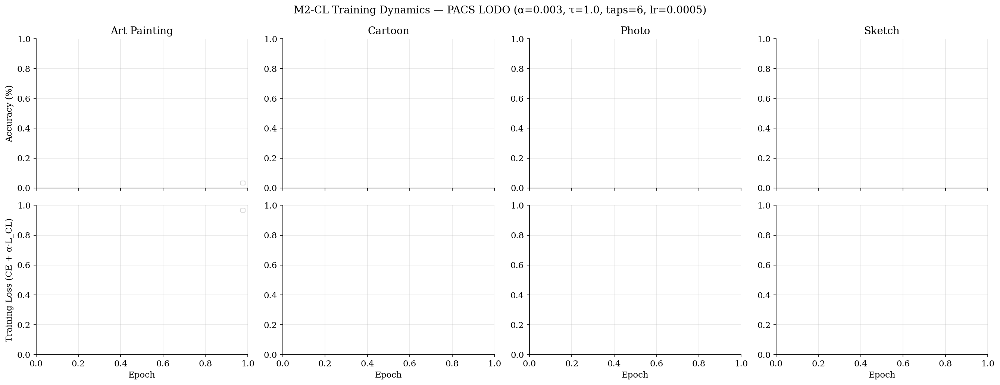

In [22]:
# ============================================================
# 15B. Training Curves — Loss & Accuracy (all 4 domains x 3 seeds)
# ============================================================

def _final_config(target_domain, seed):
    return {
        "target_domain": target_domain, "alpha": float(LOCKED_ALPHA), "tau": float(LOCKED_TAU),
        "arch_taps": int(LOCKED_TAPS), "augmentation": LOCKED_AUG, "model_name": LOCKED_MODEL,
        "epochs": int(LOCKED_EPOCHS), "batch_size": int(LOCKED_BATCH_SIZE),
        "img_size": int(LOCKED_IMG_SIZE), "seed": int(seed),
    }

def load_history_for(target_domain, seed):
    run_id = _run_id(_final_config(target_domain, seed))
    best_path = os.path.join(CKPT_DIR, run_id, "best.pt")
    if not os.path.exists(best_path):
        print(f"  [missing checkpoint] {target_domain} seed={seed} run_id={run_id}")
        return None
    ckpt = _load_checkpoint(best_path)
    return ckpt.get("history", [])

fig, axes = plt.subplots(2, 4, figsize=(18, 7), sharex=True)
colors = plt.cm.viridis(np.linspace(0.15, 0.85, len(FINAL_SEEDS)))

for col, target in enumerate(PACS_DOMAINS):
    for seed, c in zip(FINAL_SEEDS, colors):
        hist = load_history_for(target, seed)
        if not hist:
            continue
        ep = [h["epoch"] for h in hist]
        axes[0, col].plot(ep, [h["train_acc"] for h in hist], color=c, alpha=0.9, label=f"seed {seed} train")
        axes[0, col].plot(ep, [h["val_acc"] for h in hist], color=c, alpha=0.9, linestyle="--", label=f"seed {seed} val")
        axes[1, col].plot(ep, [h["loss"] for h in hist], color=c, alpha=0.9, label=f"seed {seed}")
    axes[0, col].set_title(target.replace("_", " ").title())
    axes[1, col].set_xlabel("Epoch")

axes[0, 0].set_ylabel("Accuracy (%)")
axes[1, 0].set_ylabel("Training Loss (CE + \u03b1\u00b7L_CL)")
axes[0, 0].legend(fontsize=7, loc="lower right")
axes[1, 0].legend(fontsize=7, loc="upper right")
fig.suptitle(f"M2-CL Training Dynamics \u2014 PACS LODO "
             f"(\u03b1={LOCKED_ALPHA}, \u03c4={LOCKED_TAU}, taps={LOCKED_TAPS}, lr={LOCKED_LR})")
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "fig_training_curves.png"), bbox_inches="tight")
plt.show()


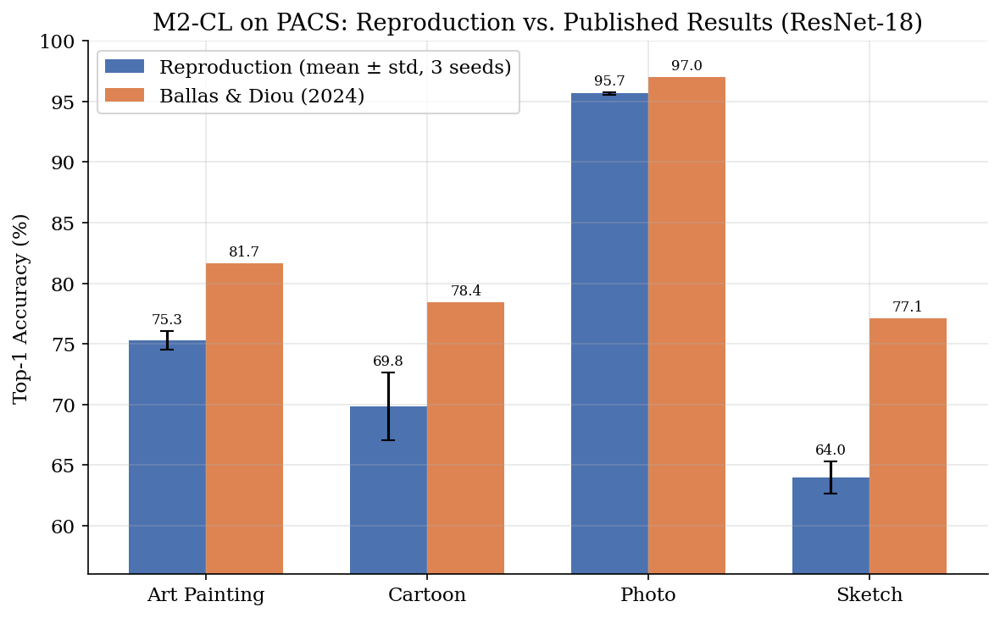

Reproduction average: 76.19%  |  Paper average: 83.54%  |  Gap: -7.35pp


In [23]:
# ============================================================
# 15C. Results vs. Paper \u2014 Table I style bar chart with error bars
# ============================================================
x = np.arange(len(PACS_DOMAINS))
width = 0.35

ours_mean = [summary.loc[d, "mean"] for d in PACS_DOMAINS]
ours_std = [summary.loc[d, "std"] for d in PACS_DOMAINS]
paper_vals = [PAPER_M2CL[d] for d in PACS_DOMAINS]

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(x - width/2, ours_mean, width, yerr=ours_std, capsize=4,
       label="Reproduction (mean \u00b1 std, 3 seeds)", color="#4C72B0")
ax.bar(x + width/2, paper_vals, width, label="Ballas & Diou (2024)", color="#DD8452")

ax.set_xticks(x)
ax.set_xticklabels([d.replace("_", " ").title() for d in PACS_DOMAINS])
ax.set_ylabel("Top-1 Accuracy (%)")
ax.set_ylim(min(min(ours_mean), min(paper_vals)) - 8, 100)
ax.set_title("M2-CL on PACS: Reproduction vs. Published Results (ResNet-18)")
ax.legend()

for i, (m, s) in enumerate(zip(ours_mean, ours_std)):
    ax.annotate(f"{m:.1f}", (x[i] - width/2, m + s + 0.6), ha="center", fontsize=8)
for i, p in enumerate(paper_vals):
    ax.annotate(f"{p:.1f}", (x[i] + width/2, p + 0.6), ha="center", fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "fig_results_vs_paper.png"), bbox_inches="tight")
plt.show()

print(f"Reproduction average: {np.mean(ours_mean):.2f}%  |  Paper average: {np.mean(paper_vals):.2f}%  "
      f"|  Gap: {np.mean(ours_mean) - np.mean(paper_vals):+.2f}pp")


## 16. ERM Baseline (Required for Fig. 6/7-Style Saliency Comparison)

The `ERM` class in Section 5 was defined but never trained anywhere in this
notebook — every result so far compares M2 / M2-CL configurations against each
other or against the *paper's* published ERM numbers, never against a baseline
that this codebase actually trained under identical conditions. To reproduce the
paper's qualitative claim in Figs. 6–7 ("our method focuses on invariant features
while ERM attends to background/context"), you need an ERM checkpoint trained on
the exact same data splits, seed, and augmentation as the locked M2-CL runs — a
paper-vs-paper accuracy number is not sufficient for a same-conditions saliency
comparison, since a different training run introduces confounds.

This cell trains one ERM model per held-out target domain (seed=0, 30 epochs,
same LR/augmentation as the locked config) and caches it exactly like the M2-CL
runs, so it is only paid for once.


In [24]:
# ============================================================
# 16A. Train ERM Baseline (one run per target domain, seed=0)
# ============================================================
RUN_ERM_BASELINE = True  # set False once these checkpoints exist and you're re-running the notebook

if RUN_ERM_BASELINE:
    ERM_RESULTS = []
    for target in PACS_DOMAINS:
        print("\n" + "=" * 80)
        print(f"ERM BASELINE | target={target}")
        print("=" * 80)
        r = run_experiment(
            target_domain=target,
            alpha=0.0,                 # inert for ERM (model.forward returns reps=None)
            tau=LOCKED_TAU,
            arch_taps=LOCKED_TAPS,      # inert for ERM, kept for a stable/unique run_id
            augmentation=LOCKED_AUG,
            model_name="erm",
            epochs=LOCKED_EPOCHS,
            batch_size=LOCKED_BATCH_SIZE,
            img_size=LOCKED_IMG_SIZE,
            seed=0,
            evaluate_target=True,
            resume=True,
        )
        ERM_RESULTS.append(public_record(r))

    erm_df = pd.DataFrame(ERM_RESULTS)
    display(erm_df[["target_domain", "best_val_acc", "test_acc"]])
    print(f"\nERM baseline PACS average: {erm_df['test_acc'].mean():.2f}%")
    print(f"Paper's own reported ERM average (Table I, ResNet-18): 80.53%")
    print("A large gap here would indicate the training pipeline itself (not just M2-CL)")
    print("diverges from the paper's protocol \u2014 worth checking before trusting saliency maps.")



ERM BASELINE | target=art_painting
  [art_painting held out]
  Train domains: ['cartoon', 'photo', 'sketch']
  Train images : 6,354
  Val/domain   : [('cartoon', 469), ('photo', 334), ('sketch', 786)]
  Test images  : 2,048
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 185MB/s]



=== NEW RUN 4377019b294a ===
{
  "target_domain": "art_painting",
  "alpha": 0.0,
  "tau": 1.0,
  "arch_taps": 6,
  "augmentation": "baseline",
  "model_name": "erm",
  "epochs": 30,
  "batch_size": 128,
  "img_size": 224,
  "seed": 0
}
Train domains: ['cartoon', 'photo', 'sketch']
Checkpoint dir: /content/drive/MyDrive/m2cl_improvement_checkpoints/4377019b294a
  ep 01/30 loss=1.6096 train=41.75% val_mean=69.44% val={'cartoon': 62.89978678038379, 'photo': 78.74251497005989, 'sketch': 66.66666666666667} (52s)  checkpointed✓
  ep 02/30 loss=0.9346 train=73.29% val_mean=81.24% val={'cartoon': 76.7590618336887, 'photo': 89.22155688622755, 'sketch': 77.735368956743} (48s)  checkpointed✓
  ep 03/30 loss=0.6655 train=81.98% val_mean=86.58% val={'cartoon': 82.51599147121536, 'photo': 94.0119760479042, 'sketch': 83.20610687022901} (54s)  checkpointed✓
  ep 04/30 loss=0.5284 train=84.61% val_mean=88.46% val={'cartoon': 84.86140724946695, 'photo': 94.91017964071857, 'sketch': 85.6234096692112} (

,target_domain,best_val_acc,test_acc
0,art_painting,94.138616,73.144531
1,cartoon,95.507830,69.965870
2,photo,93.251333,94.790419
3,sketch,93.776978,66.403665



ERM baseline PACS average: 76.08%
Paper's own reported ERM average (Table I, ResNet-18): 80.53%
A large gap here would indicate the training pipeline itself (not just M2-CL)
diverges from the paper's protocol — worth checking before trusting saliency maps.


## 17. Saliency Maps — ERM vs. M2-CL (Simonyan et al., 2014)

Reproduces the qualitative evidence in the paper's Figs. 6–7 using vanilla
input-gradient saliency (the method the paper itself cites, ref. [90]), on
images from the held-out target domain that neither model saw during training.


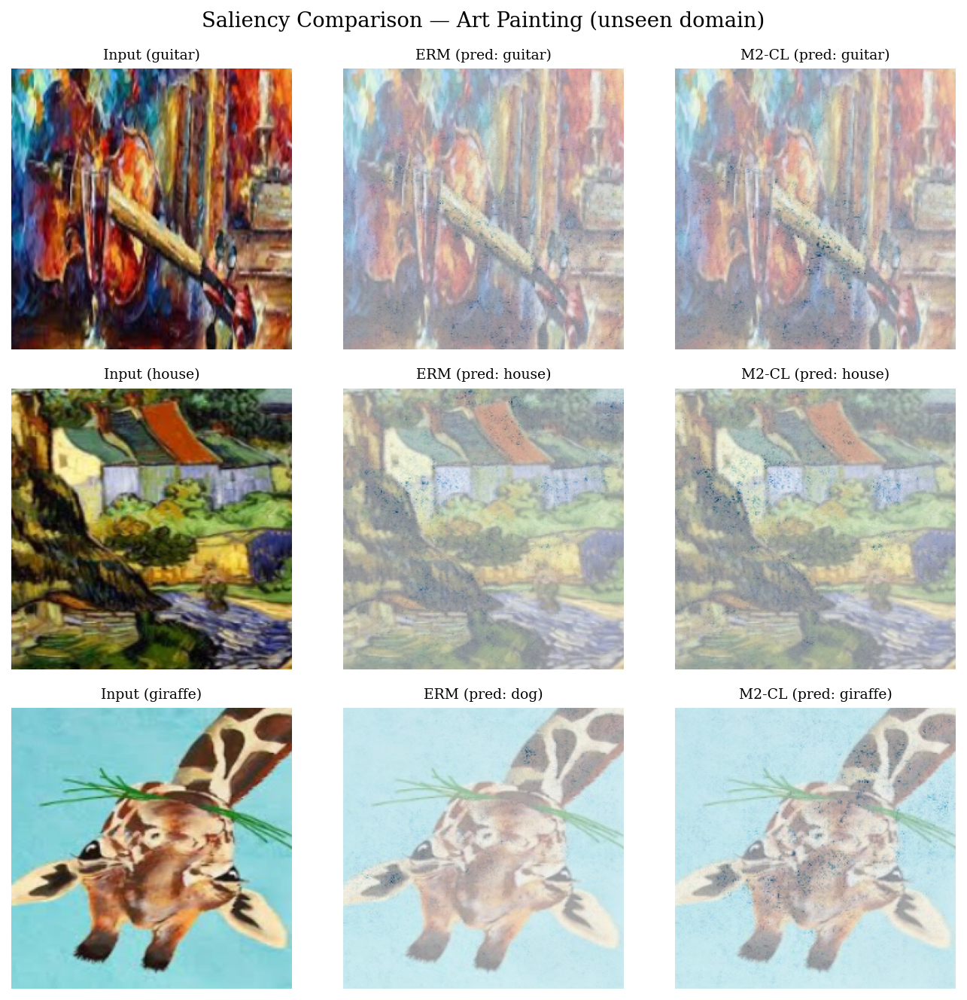

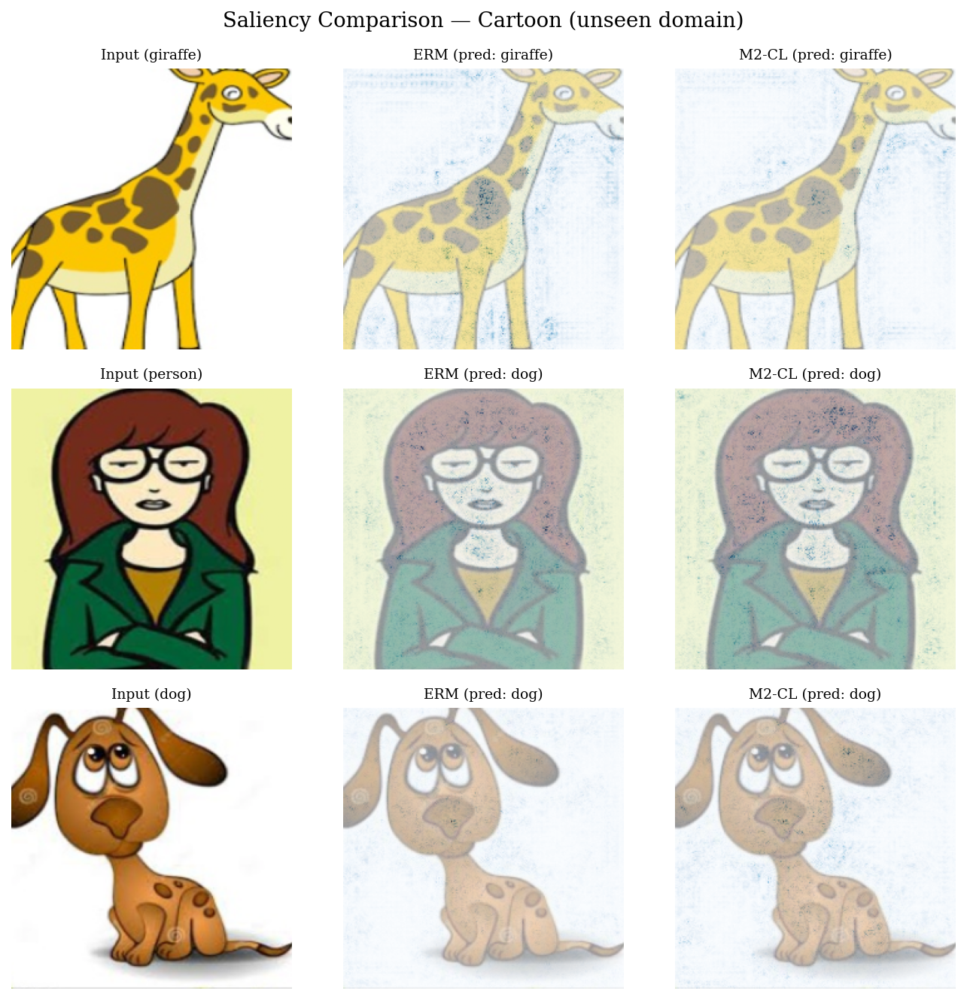

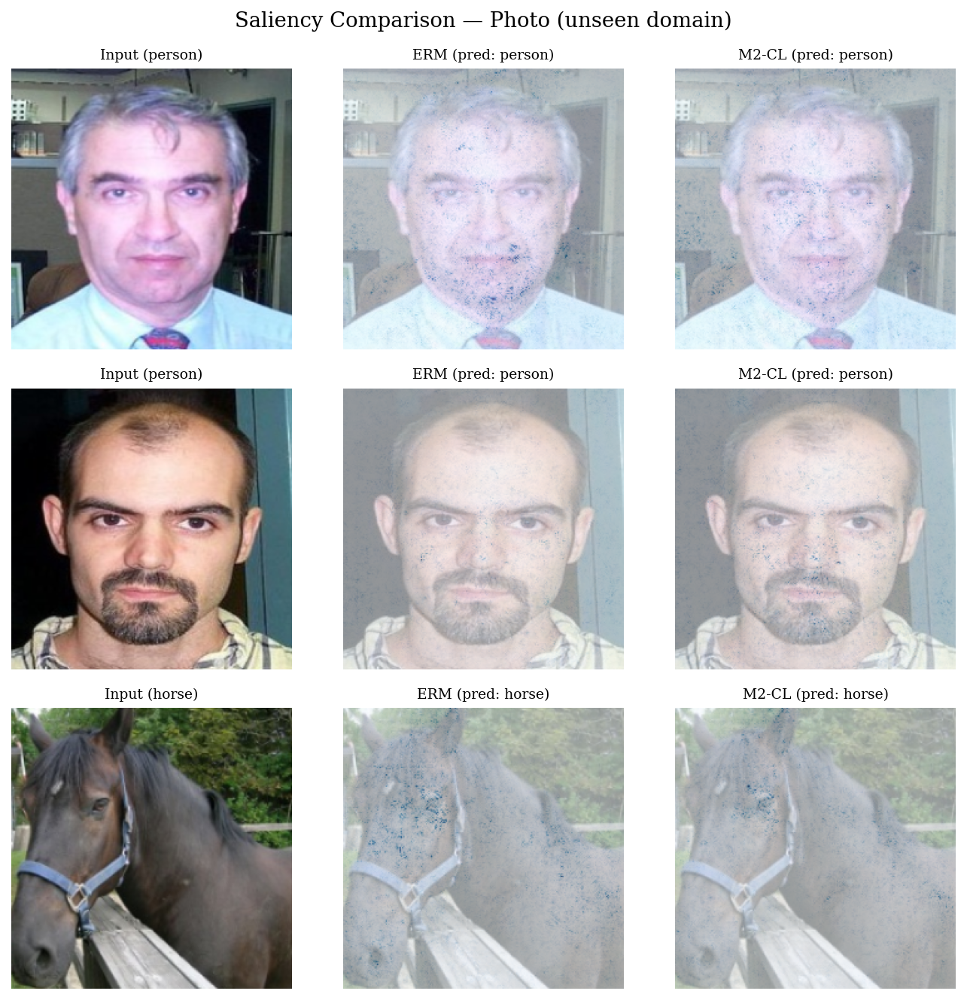

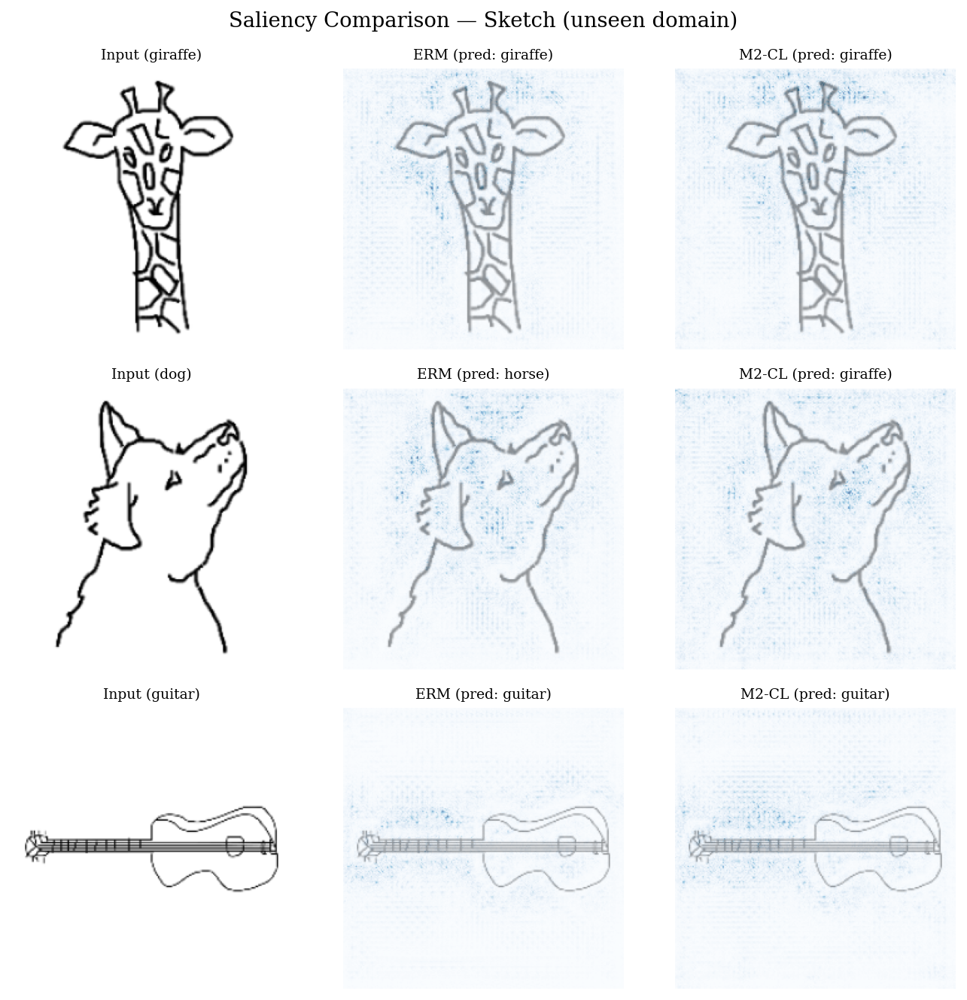

In [25]:
# ============================================================
# 17A. Saliency Map Utilities
# ============================================================

def load_best_model(model_name, target_domain, seed=0, taps=LOCKED_TAPS,
                     alpha=None, tau=LOCKED_TAU, aug=LOCKED_AUG,
                     epochs=LOCKED_EPOCHS, num_classes=7):
    alpha_ = 0.0 if model_name == "erm" else (LOCKED_ALPHA if alpha is None else alpha)
    cfg = {
        "target_domain": target_domain, "alpha": float(alpha_), "tau": float(tau),
        "arch_taps": int(taps), "augmentation": aug, "model_name": model_name,
        "epochs": int(epochs), "batch_size": int(LOCKED_BATCH_SIZE),
        "img_size": int(LOCKED_IMG_SIZE), "seed": int(seed),
    }
    run_id = _run_id(cfg)
    best_path = os.path.join(CKPT_DIR, run_id, "best.pt")
    if not os.path.exists(best_path):
        raise FileNotFoundError(f"No checkpoint at {best_path}\nconfig={cfg}")
    ckpt = _load_checkpoint(best_path)
    model = build_model(model_name, num_classes, taps).to(DEVICE)
    model.load_state_dict(ckpt["model_state"], strict=True)
    model.eval()
    return model


def compute_saliency(model, img_tensor, target_class=None):
    """Vanilla-gradient saliency map (Simonyan, Vedaldi & Zisserman, ICLR-W 2014),
    the method cited by the paper for Figs. 6-7."""
    was_trainable = [p.requires_grad for p in model.parameters()]
    for p in model.parameters():
        p.requires_grad_(False)  # only the input needs a gradient here

    x = img_tensor.clone().unsqueeze(0).to(DEVICE).requires_grad_(True)
    logits, _ = model(x)
    if target_class is None:
        target_class = logits.argmax(1).item()
    logits[0, target_class].backward()
    sal = x.grad.data.abs().max(dim=1)[0].squeeze(0).cpu().numpy()

    for p, flag in zip(model.parameters(), was_trainable):
        p.requires_grad_(flag)
    return sal, target_class


def unnormalize(img_tensor):
    mean = torch.tensor(MEAN).view(3, 1, 1)
    std = torch.tensor(STD).view(3, 1, 1)
    return (img_tensor.cpu() * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()


def plot_saliency_grid(target_domain, n_images=3, m2cl_seed=0, sample_seed=1):
    _, test_tf = get_augmentation(LOCKED_AUG, LOCKED_IMG_SIZE)
    classes = get_classes(PACS_ROOT)
    test_samples = build_paths(PACS_ROOT, [target_domain], classes)
    rng = np.random.RandomState(sample_seed)
    picks = rng.choice(len(test_samples), size=n_images, replace=False)

    erm_model = load_best_model("erm", target_domain, seed=0)
    m2cl_model = load_best_model("m2cl", target_domain, seed=m2cl_seed)

    fig, axes = plt.subplots(n_images, 3, figsize=(9, 3 * n_images))
    if n_images == 1:
        axes = axes[None, :]

    for row, idx in enumerate(picks):
        path, label = test_samples[idx]
        img = test_tf(Image.open(path).convert("RGB"))

        sal_erm, pred_erm = compute_saliency(erm_model, img)
        sal_m2cl, pred_m2cl = compute_saliency(m2cl_model, img)
        rgb = unnormalize(img)

        axes[row, 0].imshow(rgb)
        axes[row, 0].set_title(f"Input ({classes[label]})", fontsize=9)
        axes[row, 1].imshow(rgb); axes[row, 1].imshow(sal_erm, cmap="Blues", alpha=0.6)
        axes[row, 1].set_title(f"ERM (pred: {classes[pred_erm]})", fontsize=9)
        axes[row, 2].imshow(rgb); axes[row, 2].imshow(sal_m2cl, cmap="Blues", alpha=0.6)
        axes[row, 2].set_title(f"M2-CL (pred: {classes[pred_m2cl]})", fontsize=9)
        for c in range(3):
            axes[row, c].axis("off")

    fig.suptitle(f"Saliency Comparison \u2014 {target_domain.replace('_',' ').title()} (unseen domain)")
    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, f"fig_saliency_{target_domain}.png"), bbox_inches="tight")
    plt.show()


for target in PACS_DOMAINS:
    plot_saliency_grid(target, n_images=3)


## 18. t-SNE of Multi-Level Representations (Disentanglement Extension)

Not in the paper. The paper's evidence for disentanglement is entirely
qualitative (saliency maps). This adds a quantitative-adjacent visual: a t-SNE
projection of the concatenated extraction-block outputs on the **held-out**
target domain, colored by class. If the framework is doing what Section III-A
claims, same-class points from an unseen domain should still cluster —
this directly probes the contrastive loss's stated objective (Eq. 3–5) rather
than just inspecting where the model looks.


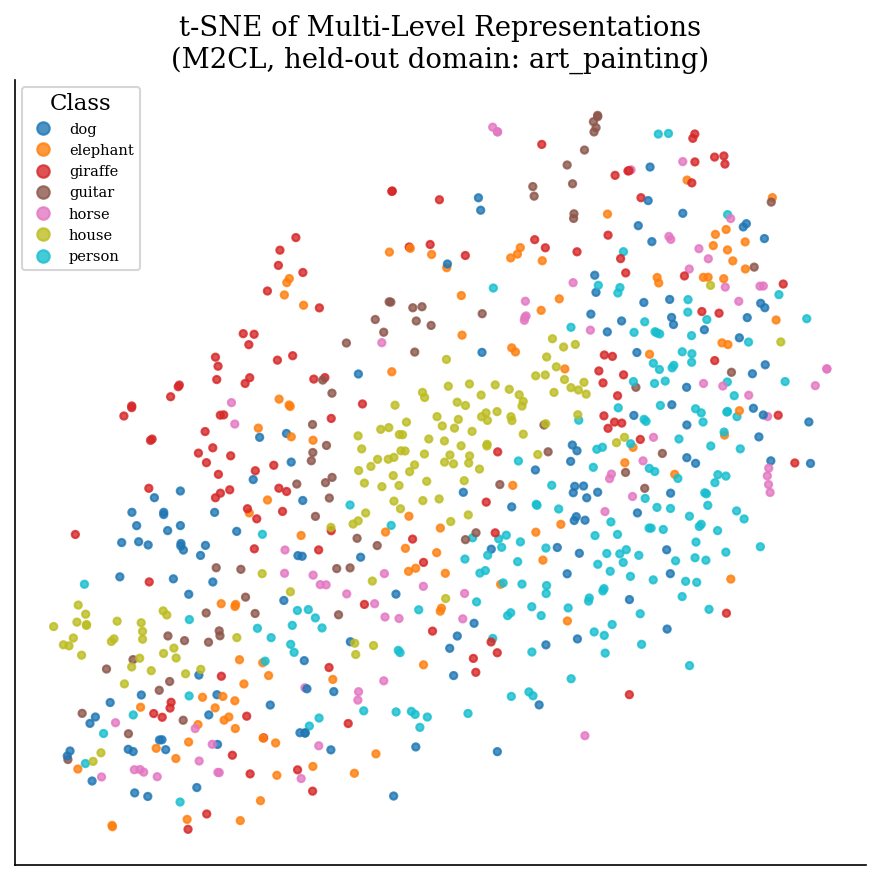

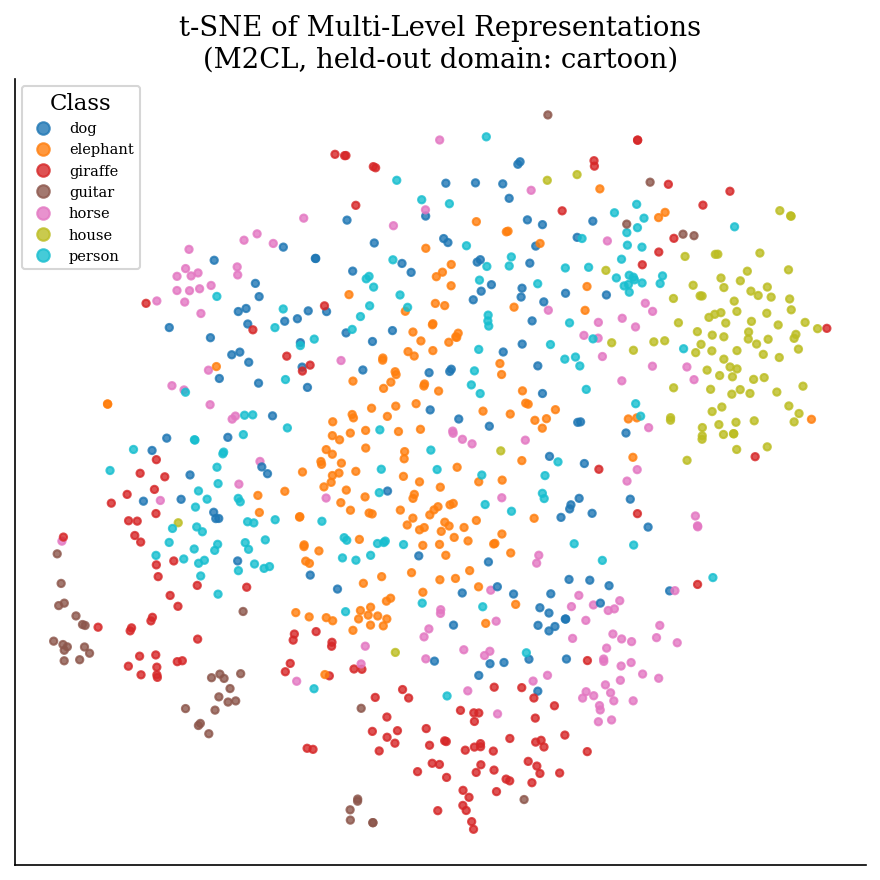

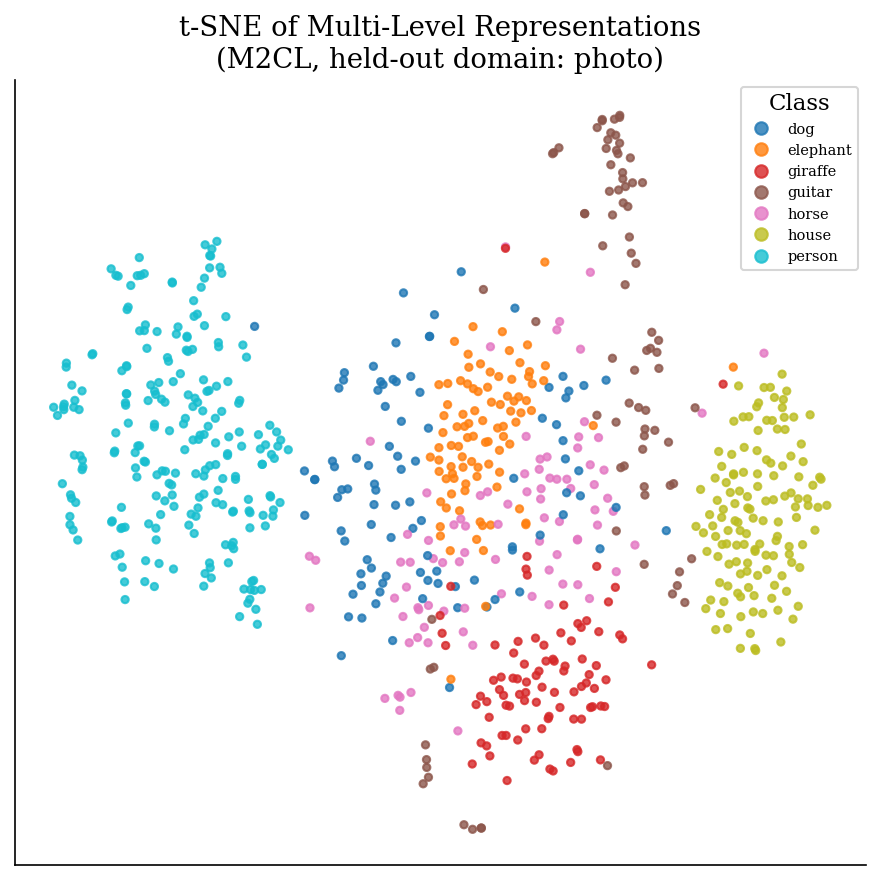

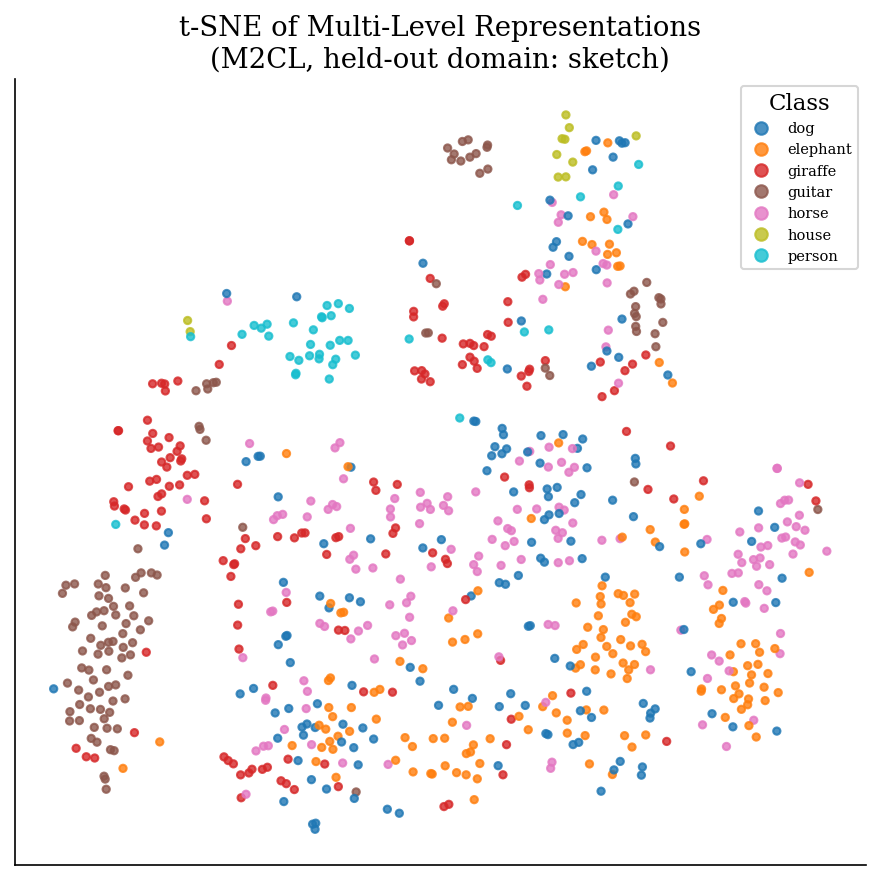

In [26]:
# ============================================================
# 18A. t-SNE on Held-Out-Domain Representations
# ============================================================
from sklearn.manifold import TSNE

@torch.no_grad()
def collect_features(model, loader, max_samples=800):
    model.use_cl = True  # force forward() to return `reps`; extraction blocks always compute them
    feats, labels = [], []
    n = 0
    for imgs, lbl in loader:
        imgs = imgs.to(DEVICE)
        _, reps = model(imgs)
        pooled = torch.cat(reps, dim=1)
        feats.append(pooled.cpu().numpy())
        labels.append(lbl.numpy())
        n += len(lbl)
        if n >= max_samples:
            break
    return np.concatenate(feats)[:max_samples], np.concatenate(labels)[:max_samples]


def plot_tsne(target_domain, seed=0, model_name="m2cl"):
    _, test_tf = get_augmentation(LOCKED_AUG, LOCKED_IMG_SIZE)
    classes = get_classes(PACS_ROOT)
    test_samples = build_paths(PACS_ROOT, [target_domain], classes)
    loader = DataLoader(TransformDataset(test_samples, test_tf), batch_size=128,
                         shuffle=True, num_workers=NUM_WORKERS)

    model = load_best_model(model_name, target_domain, seed=seed)
    feats, labels = collect_features(model, loader)

    emb = TSNE(n_components=2, perplexity=30, init="pca", random_state=0).fit_transform(feats)

    fig, ax = plt.subplots(figsize=(6, 6))
    scatter = ax.scatter(emb[:, 0], emb[:, 1], c=labels, cmap="tab10", s=12, alpha=0.8)
    handles, _ = scatter.legend_elements(num=len(classes))
    ax.legend(handles, classes, fontsize=7, loc="best", title="Class")
    ax.set_title(f"t-SNE of Multi-Level Representations\n"
                 f"({model_name.upper()}, held-out domain: {target_domain})")
    ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, f"fig_tsne_{model_name}_{target_domain}.png"), bbox_inches="tight")
    plt.show()


for target in PACS_DOMAINS:
    plot_tsne(target, seed=0, model_name="m2cl")
